In [1]:
import re
import pandas as pd
import numpy as np
from collections import defaultdict

# Set Pandas to display all rows of dataframes
pd.set_option('display.max_rows', 500)

# nltk
from nltk import tokenize

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Plotting tools
import matplotlib.pyplot as plt
import matplotlib
plt.style.use('fivethirtyeight')
%matplotlib inline

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

from tqdm import tqdm_notebook as tqdm
from tqdm import trange

In [2]:
with open("../Mahabharata/data/mhbhrt/mahafull.txt", "r", encoding='utf8') as f:
    file = f.read()

In [3]:
raw = file.split("BOOK")[1:]
print("Number of chapters in the book: ",len(raw))

Number of chapters in the book:  18


In [4]:
book_df = pd.DataFrame({"book": raw})

In [6]:
books = book_df.copy()
books['book_num'] = books.index+1

In [7]:
books

,book,book_num
0,1\n\nADI PARVA\n\nTRANSLATOR'S PREFACE\n\nThe...,1
1,2\n\nSABHA PARVA\n\n\nSECTION I\n\n(Sabhakriy...,2
2,3 \n\nVANA PARVA\n\nSECTION I\n\n(Aranyaka Pa...,3
3,4\n\nVIRATA PARVA\n\nSECTION I\n\n(Pandava-Pr...,4
4,5\n\nUDYOGA PARVA\n\nSECTION I\n\nOM! HAVING ...,5
5,6\n\nBHISHMA PARVA\n\nSECTION I\n\n(Jamvu-kha...,6
6,7\n\nDRONA PARVA\n\nSECTION I\n\n(Dronabhishe...,7
7,8\n\nKARNA-PARVA\n\nSECTION 1\n\nOm! Having b...,8
8,9\n\nSHALYA-PARVA\n\nSECTION 1\n\nOm! Having ...,9
9,10\n\nSAUPTIKA-PARVA\n\nSECTION 1\n\nOm! Havi...,10


In [10]:
books['book'] = books.book.str.replace("\n", " ")
booksDict = {}
for i in range(len(raw)):
    booksDict[i+1] = books.loc[i]['book']

In [11]:
booksDict

{1: ' 1  ADI PARVA  TRANSLATOR\'S PREFACE  The object of a translator should ever be to hold the mirror upto his author. That being so, his chief duty is to represent so far as practicable the manner in which his author\'s ideas have been expressed, retaining if possible at the sacrifice of idiom and taste all the peculiarities of his author\'s imagery and of language as well. In regard to translations from the Sanskrit, nothing is easier than to dish up Hindu ideas, so as to make them agreeable to English taste. But the endeavour of the present translator has been to give in the following pages as literal a rendering as possible of the great work of Vyasa. To the purely English reader there is much in the following pages that will strike as ridiculous. Those unacquainted with any language but their own are generally very exclusive in matters of taste. Having no knowledge of models other than what they meet with in their own tongue, the standard they have formed of purity and taste in 

In [12]:
analyzer = SentimentIntensityAnalyzer()

In [18]:
sentimentsDictionary = {}
for book_number,content in booksDict.items():
    content = content[2:]
    sentence_list = tokenize.sent_tokenize(content)
    sentiments = {'compound': 0.0, 'neg': 0.0, 'neu': 0.0, 'pos': 0.0}
    
    for sentence in sentence_list:
            vs = analyzer.polarity_scores(sentence)
            sentiments['compound'] += vs['compound']
            sentiments['neg'] += vs['neg']
            sentiments['neu'] += vs['neu']
            sentiments['pos'] += vs['pos']
    sentiments['compound'] = sentiments['compound'] / len(sentence_list)
    sentiments['neg'] = sentiments['neg'] / len(sentence_list)
    sentiments['neu'] = sentiments['neu'] / len(sentence_list)
    sentiments['pos'] = sentiments['pos'] / len(sentence_list)
    sentimentsDictionary[book_number] = sentiments

In [19]:
sentimentsDictionary

{1: {'compound': 0.1749617657221839,
  'neg': 0.05873168624740848,
  'neu': 0.8175931237042169,
  'pos': 0.12367423980649613},
 2: {'compound': 0.19925883668903888,
  'neg': 0.06244854586129762,
  'neu': 0.8066641498881434,
  'pos': 0.1308873042505593},
 3: {'compound': 0.16283574481458118,
  'neg': 0.06280018856065381,
  'neu': 0.8160654934003782,
  'pos': 0.12113243243243223},
 4: {'compound': 0.11241964819117191,
  'neg': 0.07415101228011946,
  'neu': 0.8149522071025554,
  'pos': 0.11090375041486893},
 5: {'compound': 0.1338787984278482,
  'neg': 0.07585412689500268,
  'neu': 0.7987999999999985,
  'pos': 0.1253458731049965},
 6: {'compound': 0.05333053207951457,
  'neg': 0.07829234614926803,
  'neu': 0.8259695274372075,
  'pos': 0.09573669801214124},
 7: {'compound': 0.022206566358655998,
  'neg': 0.09419944394472185,
  'neu': 0.8063993785264527,
  'pos': 0.09940264943985605},
 8: {'compound': 0.03421357964673487,
  'neg': 0.10049894668611284,
  'neu': 0.7904887376438149,
  'pos': 0

In [20]:
compound_sentiments = [sentimentsDictionary[i+1]['compound'] for i in range(len(sentimentsDictionary))]

In [21]:
compound_sentiments

[0.1749617657221839,
 0.19925883668903888,
 0.16283574481458118,
 0.11241964819117191,
 0.1338787984278482,
 0.05333053207951457,
 0.022206566358655998,
 0.03421357964673487,
 0.08853879591393196,
 -0.005912286995515688,
 -0.02939928952042625,
 0.1209321882869507,
 0.18382576814326082,
 0.14254931374444235,
 0.14218315621679084,
 0.015720772946859918,
 0.18117712765957442,
 0.17759204301075257]

Text(0, 0.5, 'Average Sentiment')

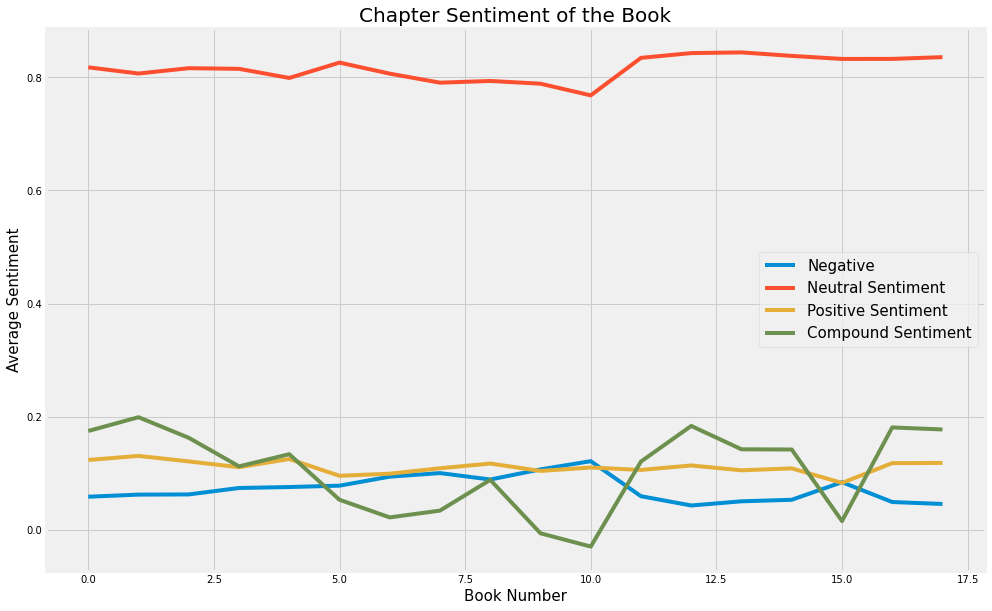

In [22]:
length = len(raw)
neg_sentiment = []
neu_sentiment = []
pos_sentiment = []
compound_sentiment = []

x = np.linspace(0, length - 1, num=length)
for k,v in sentimentsDictionary.items():
    neg_sentiment.append(v['neg'])
    neu_sentiment.append(v['neu'])
    pos_sentiment.append(v['pos'])
    compound_sentiment.append(v['compound'])
plt.figure(figsize=(15, 10))
plt.plot(x,neg_sentiment,label = "Negative")
plt.plot(x,neu_sentiment,label = "Neutral Sentiment")
plt.plot(x,pos_sentiment,label = "Positive Sentiment")
plt.plot(x,compound_sentiment,label = "Compound Sentiment")
plt.legend(loc='best', fontsize=15)
plt.title('Chapter Sentiment of the Book', fontsize=20)
plt.xlabel('Book Number', fontsize=15)
plt.ylabel('Average Sentiment', fontsize=15)